In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import keras
import tensorflow as tf
import time
import os
import cv2
import urllib.request
%matplotlib inline

In [ ]:
!git clone https://github.com/fizyr/keras-retinanet.git
%cd keras-retinanet/
!python setup.py build_ext --inplace
!pip install --upgrade git+https://github.com/broadinstitute/keras-resnet
import keras_resnet
from keras_retinanet import models
from keras_retinanet.utils.image import read_image_bgr, preprocess_image, resize_image
from keras_retinanet.utils.visualization import draw_box, draw_caption
from keras_retinanet.utils.colors import label_color
from keras_retinanet import models

fatal: destination path 'keras-retinanet' already exists and is not an empty directory.
/content/keras-retinanet
running build_ext
skipping 'keras_retinanet/utils/compute_overlap.c' Cython extension (up-to-date)
copying build/lib.linux-x86_64-3.7/keras_retinanet/utils/compute_overlap.cpython-37m-x86_64-linux-gnu.so -> keras_retinanet/utils
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/broadinstitute/keras-resnet to /tmp/pip-req-build-orgypcc6
  Running command git clone -q https://github.com/broadinstitute/keras-resnet /tmp/pip-req-build-orgypcc6


# Summary of Models used:

## Model 1: SSD MobileNet V2
*   Trained on: MS COCO dataset.
*   Object Classes: 90 (Which includes our 12 target classes)<br>
<br>This model is used for detection as is, without any additional training or transfer learning.<br>
Hence, this will give us an idea of how models trained on generic object detection datasets like MS COCO perform on Aerial Images.



## Model 2: RetinaNet
*   Trained on: VisDrone Dataset of Aerial Images
*   Object Classes: 12<br><br>
This model was trained on Google Colab and Local System under time and performance contraints.<br>
Due to these contraints, the model was trained only for 25 epochs, which is not sufficient.<br>
Hence, this will give us an idea of how a self trained model would perform on Aerial Images



## Model 3: TPH YOLOv5
*   Trained on: VisDrone Dataset of Aerial Images
*   Object Classes: 12<br><br>
This model was trained professionally on the VisDrone dataset with no contraints.<br>
This was model was ranked 5th in the VisDroneDET 2022 challenge.<br>
Hence, this will give us an idea of how a State of the Art model would perform on Aerial Images



# Comparison of mean Average Precision (mAP)

Mean average precision (mAP) is calculated by first gathering a set of predicted object detections and a set of ground truth object annotations.
*	For each prediction, IoU is computed with respect to each ground truth box in the image.
*	These IoUs are then thresholded to some value (generally between 0.5 and 0.95) and predictions are matched with ground truth boxes using a greedy strategy 
* The mean of the AP of all object classes is the mAP.

## Overall mAP

**Model 1- SSD MobileNet V2**: 0.202

**Model 2- RetinaNet**: 0.2797

**Model 3- TPH YOLOv5:** 0.408

## Class-wise mAP

In [ ]:
import pandas as pd
 
# read by default 1st sheet of an excel file
dataframe1 = pd.read_excel('/content/drive/MyDrive/AP Scores.xlsx')
 
print(dataframe1)

          class    SSD  YOLOv3  RetinaNet  Faster R-CNN   RFCN  SNIPER  \
0    pedestrain  13.20   32.64      50.21         21.36  21.20   37.97   
1        people   5.50   16.92      31.14         56.74   7.05   23.74   
2       Bicycle  12.70   36.94      23.53         16.97  16.16   34.73   
3           Car  36.90   51.67      52.05         46.85  44.22   56.51   
4           Van   9.60   33.65      27.27         18.72  20.12   31.90   
5         Truck   7.70   12.83      23.92         16.96  28.10    6.72   
6      Tricycle   1.30    8.97      21.16         12.22  19.45   21.05   
7    A-Tricycle   9.10   26.01      23.55         10.81  15.21   14.60   
8           Bus   9.10    4.87       8.97          9.09  13.28   12.86   
9         Motor   4.60   26.36      20.81         11.13  10.76   22.39   
10          mAP  10.97   25.08      28.26         17.51  19.55   26.24   

    CenterNet  
0       56.74  
1       37.37  
2       27.06  
3       59.86  
4       30.00  
5       28.10  

In [ ]:
yolo_mAP = {'pedestrain': 0.408,
            'people': 0.287,
            'bicycle':0.253,
            'car':0.697,
            'van':0.484,
            'truck':0.441,
            'tricycle':0.327,
            'awning-tricycle':0.208,
            'bus':0.585,
            'motor':0.386    
}

yolo = pd.DataFrame(list(yolo_mAP.items()), columns=['Class', 'mAP'])
yolo

,Class,mAP
0,pedestrain,0.408
1,people,0.287
2,bicycle,0.253
3,car,0.697
4,van,0.484
5,truck,0.441
6,tricycle,0.327
7,awning-tricycle,0.208
8,bus,0.585
9,motor,0.386


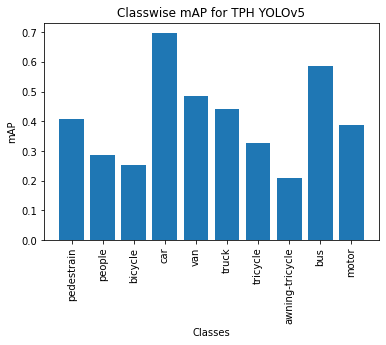

In [ ]:
plt.bar(yolo['Class'], yolo['mAP'])
plt.xticks(rotation='vertical')
plt.xlabel('Classes')
plt.ylabel('mAP')
plt.title('Classwise mAP for TPH YOLOv5')
plt.show()

In [ ]:
SSD_mAP = {'pedestrain': 0.132,
            'people': 0.055,
            'bicycle':0.127,
            'car':0.369,
            'van':0.096,
            'truck':0.077,
            'tricycle':0.013,
            'awning-tricycle':0.091,
            'bus':0.091,
            'motor':0.046    
}

SSD = pd.DataFrame(list(SSD_mAP.items()), columns=['Class', 'mAP'])
SSD

,Class,mAP
0,pedestrain,0.132
1,people,0.055
2,bicycle,0.127
3,car,0.369
4,van,0.096
5,truck,0.077
6,tricycle,0.013
7,awning-tricycle,0.091
8,bus,0.091
9,motor,0.046


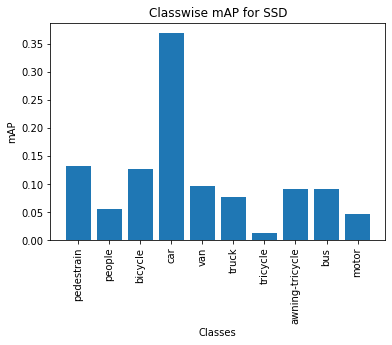

In [ ]:
plt.bar(SSD['Class'], SSD['mAP'])
plt.xticks(rotation='vertical')
plt.xlabel('Classes')
plt.ylabel('mAP')
plt.title('Classwise mAP for SSD')
plt.show()

In [ ]:
retinanet_mAP = { 'pedestrain': 0.1801,
                  'people': 0.0781,
                  'bicycle':0.0233,
                  'car':0.5656,
                  'van':0.1849,
                  'truck':0.112,
                  'tricycle':0.0816,
                  'awning-tricycle':0.0401,
                  'bus':0.1591,
                  'motor':0.1342    
}

retinanet = pd.DataFrame(list(retinanet_mAP.items()), columns=['Class', 'mAP'])
retinanet

,Class,mAP
0,pedestrain,0.1801
1,people,0.0781
2,bicycle,0.0233
3,car,0.5656
4,van,0.1849
5,truck,0.1120
6,tricycle,0.0816
7,awning-tricycle,0.0401
8,bus,0.1591
9,motor,0.1342


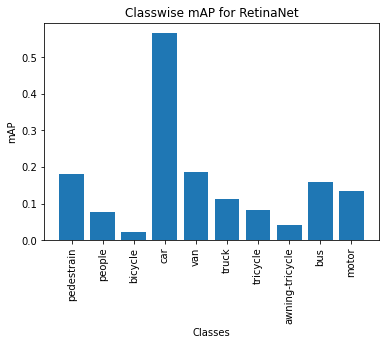

In [ ]:
plt.bar(retinanet['Class'], retinanet['mAP'])
plt.xticks(rotation='vertical')
plt.xlabel('Classes')
plt.ylabel('mAP')
plt.title('Classwise mAP for RetinaNet')
plt.show()

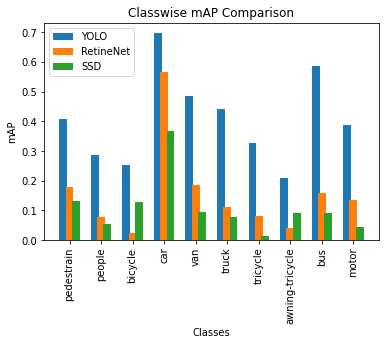

In [ ]:
X_axis = np.arange(len(yolo['Class']))
  
plt.bar(X_axis - 0.2, yolo['mAP'], 0.25, label = 'YOLO')
plt.bar(X_axis + 0, retinanet['mAP'], 0.25, label = 'RetineNet')
plt.bar(X_axis + 0.2, SSD['mAP'], 0.25, label = 'SSD')
plt.xticks(X_axis, yolo['Class'], rotation='vertical')
plt.xlabel("Classes")
plt.ylabel("mAP")
plt.title("Classwise mAP Comparison")
plt.legend()
plt.show()

In [ ]:
classes=pd.read_csv("/content/drive/MyDrive/RetinaNet/classes.csv", header=None)
annotation_val = pd.read_csv("/content/drive/MyDrive/RetinaNet/annotation_val.csv",header=None, names = ['filename','xmin','ymin','xmax', 'ymax','class'])

In [ ]:
def df_plot_original(img_path):
    df = annotation_val
    image = read_image_bgr(img_path)
    drawOG = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    df=df[df['filename']==img_path]
    for i,r in df.iterrows():
        cv2.rectangle(drawOG, (r['xmin'], r['ymin']), (r['xmax'], r['ymax']), (255,0,0),2)
    plt.figure(figsize=(20, 20))    
    plt.imshow(drawOG)

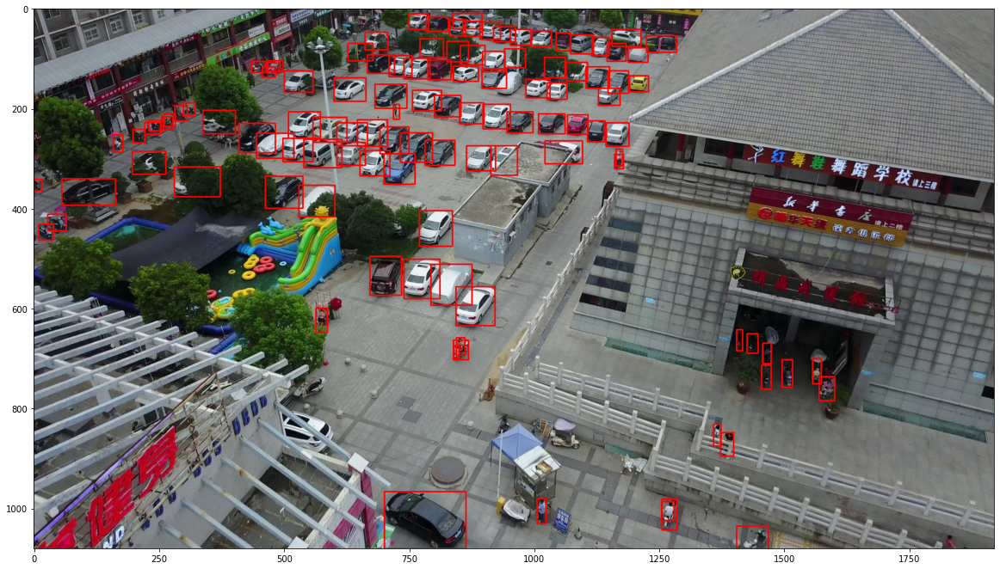

In [ ]:
df_plot_original("/content/drive/MyDrive/VisDrone2019-DET/VisDrone2019-DET-val/images/0000001_05249_d_0000009.jpg")

# Getting Retinet Tested

In [ ]:
retinanet_model_path = os.path.join('/content/drive/MyDrive/RetinaNet/snapshots', sorted(os.listdir('/content/drive/MyDrive/RetinaNet/snapshots'), reverse=True)[0])
# load retinanet model
model = models.load_model(retinanet_model_path, backbone_name='resnet50')  ## Use backbone as resnet50
model = models.convert_model(model)
# load label to names mapping for visualization purposes
labels_to_names = pd.read_csv('/content/drive/MyDrive/RetinaNet/classes.csv',header=None).T.loc[0].to_dict()

THRES_SCORE = 0.3  # Set Score Threshold Value

def img_inference(img_path):
  image = read_image_bgr(img_path)

  # copy to draw on
  draw = image.copy()
  draw = cv2.cvtColor(draw, cv2.COLOR_BGR2RGB)
  # preprocess image for network
  image = preprocess_image(image)
  image, scale = resize_image(image)

  # process image
  start = time.time()
  boxes, scores, labels = model.predict_on_batch(np.expand_dims(image, axis=0))
  # correct for image scale
  boxes /= scale
  # visualize detections
  for box, score, label in zip(boxes[0], scores[0], labels[0]):
      # scores are sorted so we can break
      #print(score)
      if score < THRES_SCORE:
          continue
      color = label_color(label)
      b = box.astype(int)
      draw_box(draw, b, color=color)
      caption = "{} {:.3f}%".format(labels_to_names[label], score*100)
    
  fig = plt.figure(figsize=(20, 20))
  plt.imshow(draw)
  plt.title('Predicted')
  plt.show()

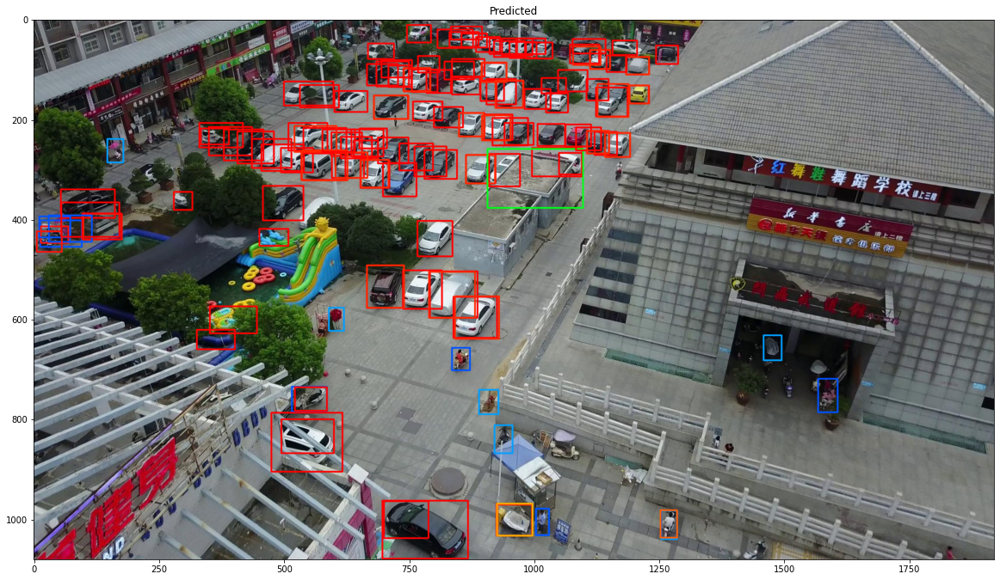

In [ ]:
# setting the path of img
img_inference("/content/drive/MyDrive/VisDrone2019-DET/VisDrone2019-DET-val/images/0000001_05249_d_0000009.jpg")

# Getting YOLO Tested

fatal: destination path 'tph-yolov5' already exists and is not an empty directory.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
detect_final: weights=['/content/drive/MyDrive/YOLO/yolov5l-xs-2.pt'], source=/content/drive/MyDrive/VisDrone2019-DET/VisDrone2019-DET-val/images/0000001_05249_d_0000009.jpg, imgsz=[1088, 1088], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=tph-yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 07c2af3 torch 1.9.1+cu102 CPU

Fusing layers... 
Model Summary: 589 layers, 68030516 parameters, 0 gradients
image 1/1 /content/drive/MyDrive/VisDrone2019-DET/VisDro

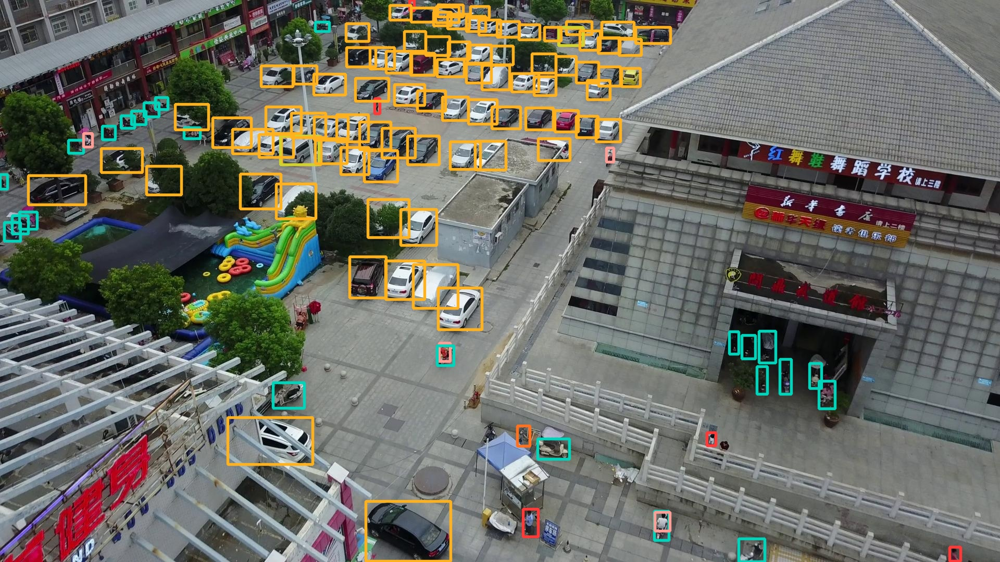

In [ ]:
!git clone https://github.com/cv516Buaa/tph-yolov5
!cd tph-yolov5
!pip install torchvision==0.10.1
!pip install torch==1.9.1
!cp /content/drive/MyDrive/YOLO/detect_final.py /content/tph-yolov5
img_path="/content/drive/MyDrive/VisDrone2019-DET/VisDrone2019-DET-val/images/0000001_05249_d_0000009.jpg"
!python "/content/tph-yolov5/detect_final.py" --source {img_path} --weights "/content/drive/MyDrive/YOLO/yolov5l-xs-2.pt" --img 1088
# path of inference
from google.colab.patches import cv2_imshow
exp_path=img_path.replace("/content/drive/MyDrive/VisDrone2019-DET/VisDrone2019-DET-val/images","/content/tph-yolov5/runs/detect/exp")
img=cv2.imread(exp_path)
cv2_imshow(img)

# Getting SSD Tested

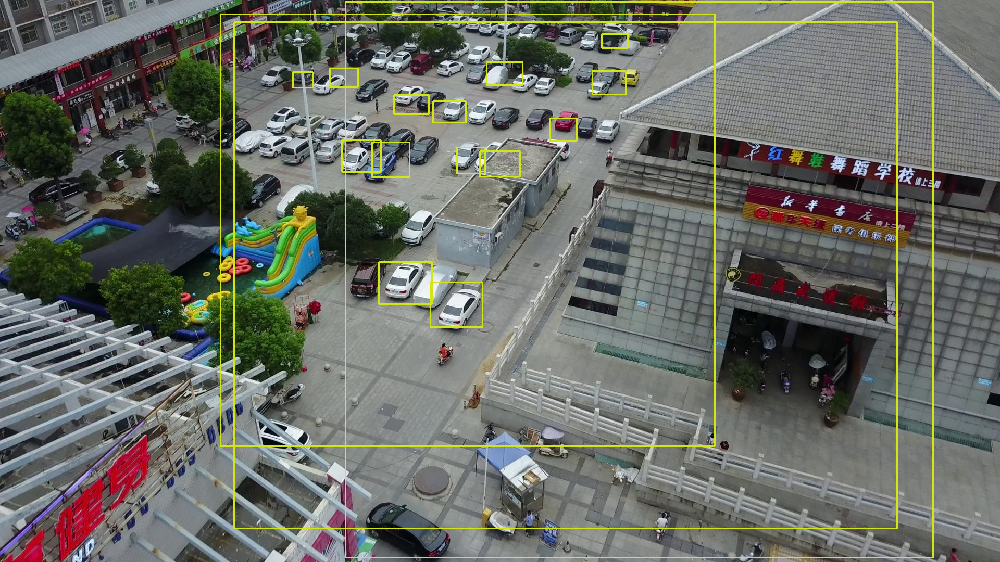

In [ ]:
import cv2

# Pretrained classes in the model
classNames = {
              1: 'People', 2: 'Bicycle', 3: 'Car', 4: 'Bicycle', 6: 'Bus',
              7: 'Tricycle', 8: 'Truck', 9: 'Awning-tricycle', 10: 'Van', 11: 'Motor',
              12 : 'Others'}


def id_class_name(class_id, classes):
    for key, value in classes.items():
        if class_id == key:
            return value


# Loading model
model = cv2.dnn.readNetFromTensorflow('/content/drive/MyDrive/SSD/models/inference.pb',
                                      '/content/drive/MyDrive/SSD/models/ssd_labels.pbtxt')
#set the path
image = cv2.imread("/content/drive/MyDrive/VisDrone2019-DET/VisDrone2019-DET-val/images/0000001_05249_d_0000009.jpg")

image_height, image_width, _ = image.shape

model.setInput(cv2.dnn.blobFromImage(image, size=(300, 300), swapRB=True))
output = model.forward()
# print(output[0,0,:,:].shape)


for detection in output[0, 0, :, :]:
    confidence = detection[2]
    if confidence > .3:
        class_id = detection[1]
        class_name=id_class_name(class_id,classNames)
        #print(str(str(class_id) + " " + str(detection[2])  + " " + class_name))
        box_x = detection[3] * image_width
        box_y = detection[4] * image_height
        box_width = detection[5] * image_width
        box_height = detection[6] * image_height
        cv2.rectangle(image, (int(box_x), int(box_y)), (int(box_width), int(box_height)), (23, 230, 210), thickness=2)
        # cv2.putText(image,class_name ,(int(box_x), int(box_y+.05*image_height)),cv2.FONT_HERSHEY_SIMPLEX,(.005*image_width),(255,255,255))





cv2_imshow(image)
cv2.imwrite("image_box_text.jpg",image)

cv2.waitKey(0)
cv2.destroyAllWindows()


# Conclusion

While all models fail to detect all the objects, we can see that:
1. YOLO model has the maximum mAP score and hence has the best performance
2. RetinaNet model has middling mAP. It needs to trained on much more epochs which is not possible on colab.
3. SSD model has the least mAP. This is apparently becuase proper training of SSD requires 200+ hrs.